## UMAP-топология жанров по MIR-баровым признакам


In [ ]:
import os
import sys
import glob
from pathlib import Path

# Определение корня проекта для работы напрямую из ноутбука (VS Code, JupyterLab)
try:
    from IPython import get_ipython
    ipython = get_ipython()
    if ipython is not None:
        notebook_name = ipython.user_ns.get('__vsc_ipynb_file__') or ipython.user_ns.get('__file__')
        if notebook_name:
            notebook_path = Path(notebook_name).resolve()
            if 'notebooks' in str(notebook_path):
                project_root = notebook_path.parent.parent
            else:
                project_root = notebook_path.parent
        else:
            cwd = Path.cwd().resolve()
            if (cwd / 'notebooks').exists() and (cwd / 'src').exists():
                project_root = cwd
            elif 'notebooks' in str(cwd):
                project_root = cwd.parent
            else:
                project_root = cwd
    else:
        raise AttributeError("Not in IPython")
except:
    cwd = Path.cwd().resolve()
    if (cwd / 'notebooks').exists() and (cwd / 'src').exists():
        project_root = cwd
    elif 'notebooks' in str(cwd):
        project_root = cwd.parent
    else:
        current = cwd
        while current != current.parent:
            if (current / 'notebooks').exists() and (current / 'src').exists():
                project_root = current
                break
            current = current.parent
        else:
            project_root = cwd

# Добавляем корневую директорию проекта и src/ в путь
sys.path.insert(0, str(project_root))
sys.path.insert(0, str(project_root / 'src'))

# Проверка и вывод информации
print(f"✓ Корень проекта: {project_root}")
print(f"✓ Путь к src: {project_root / 'src'}")
print(f"✓ Текущая рабочая директория: {Path.cwd()}")

# Дополнительная проверка структуры проекта
if (project_root / 'notebooks').exists() and (project_root / 'src').exists():
    print(f"✓ Структура проекта найдена корректно")
else:
    print(f"⚠ ВНИМАНИЕ: Структура проекта не найдена!")
    print(f"  Проверьте, что папки 'notebooks' и 'src' существуют в {project_root}")

import numpy as np
import matplotlib.pyplot as plt

from src.mir_bar_features import mir_bar_embeddings
from sklearn.preprocessing import StandardScaler
import hdbscan
import umap

plt.rcParams.update({'font.size': 12})
plt.rcParams['figure.dpi'] = 120


In [ ]:
# Папка с жанрами
# Используем project_root для надежности работы из любой директории
audio_base_dir = str(project_root / "data/top50musicSpotify")

# MIR-параметры
topology_kwargs = dict(
    beats_per_bar=4,
    use_auto_tempo=True,
    bpm=None,
)

# HDBSCAN параметры
min_cluster_size = 30
min_samples = 5

# Конфигурации UMAP (разные n_neighbors и min_dist)
UMAP_CONFIGS = [
    {"n_neighbors": 15, "min_dist": 0.1},
    {"n_neighbors": 30, "min_dist": 0.3},
    {"n_neighbors": 50, "min_dist": 0.5},
]


In [3]:
def umap_hdbscan_for_genre(genre_dir: str):
    """Строит UMAP-проекции (3 конфигурации) + HDBSCAN по MIR-признакам жанра."""
    audio_files = []
    audio_files.extend(glob.glob(os.path.join(genre_dir, "*.wav")))
    audio_files.extend(glob.glob(os.path.join(genre_dir, "*.mp3")))

    if not audio_files:
        print(f"Нет аудиофайлов в {genre_dir}")
        return

    all_bars = []
    for fpath in audio_files:
        try:
            bars = mir_bar_embeddings(file_path=fpath, **topology_kwargs)
            if bars.size == 0:
                continue
            all_bars.append(bars)
        except Exception as exc:
            print(f"Ошибка при обработке {fpath}: {exc}")

    if not all_bars:
        print(f"Не удалось получить признаки для {genre_dir}")
        return

    X = np.vstack(all_bars).astype(np.float32)
    if not np.all(np.isfinite(X)):
        raise ValueError("Input features contain NaN or inf values.")

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    if not np.all(np.isfinite(X_scaled)):
        raise ValueError("Scaled features contain NaN или inf values.")

    clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples)
    labels = clusterer.fit_predict(X_scaled)
    unique_labels = np.unique(labels)

    rows = len(UMAP_CONFIGS)
    fig, axes = plt.subplots(rows, 2, figsize=(14, 5 * rows))
    if rows == 1:
        axes = np.expand_dims(axes, axis=0)

    cmap = plt.get_cmap("tab20")

    for row, cfg in enumerate(UMAP_CONFIGS):
        reducer = umap.UMAP(
            n_components=2,
            n_neighbors=cfg["n_neighbors"],
            min_dist=cfg["min_dist"],
            metric="euclidean",
            random_state=42,
        )
        embedding = reducer.fit_transform(X_scaled)

        # Голый UMAP
        ax_plain = axes[row, 0]
        ax_plain.scatter(embedding[:, 0], embedding[:, 1], s=8, alpha=0.7, color="tab:blue")
        ax_plain.set_title(f"UMAP nn={cfg['n_neighbors']}, min_dist={cfg['min_dist']:.1f}")
        ax_plain.set_xlabel("UMAP 1")
        ax_plain.set_ylabel("UMAP 2")
        ax_plain.grid(alpha=0.3)

        # UMAP + HDBSCAN (цвет по кластерам)
        ax_cluster = axes[row, 1]
        for lab in unique_labels:
            mask = labels == lab
            color = "lightgray" if lab == -1 else cmap(lab % 20)
            label = "шум (-1)" if lab == -1 else f"кластер {lab}"
            ax_cluster.scatter(embedding[mask, 0], embedding[mask, 1], s=8, alpha=0.8, color=color, label=label)
        ax_cluster.set_title(f"UMAP + HDBSCAN (nn={cfg['n_neighbors']})")
        ax_cluster.set_xlabel("UMAP 1")
        ax_cluster.set_ylabel("UMAP 2")
        ax_cluster.grid(alpha=0.3)
        if len(unique_labels) <= 20:
            ax_cluster.legend(fontsize=8)

    fig.suptitle(f"Жанр: {os.path.basename(genre_dir)} — MIR-UMAP", fontsize=14)
    plt.tight_layout()
    plt.show()


In [4]:
# Карта жанров для удобного вызова
if not os.path.exists(audio_base_dir):
    raise FileNotFoundError(f"Папка не найдена: {audio_base_dir}")

GENRE_PATHS = {
    name: os.path.join(audio_base_dir, name)
    for name in sorted(os.listdir(audio_base_dir))
    if os.path.isdir(os.path.join(audio_base_dir, name))
}

print("Доступные жанры:", ", ".join(GENRE_PATHS.keys()))


Доступные жанры: blues, classical, country, electronic, hip-hop, jazz, metal, pop, reggae, rock


### Blues


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_job

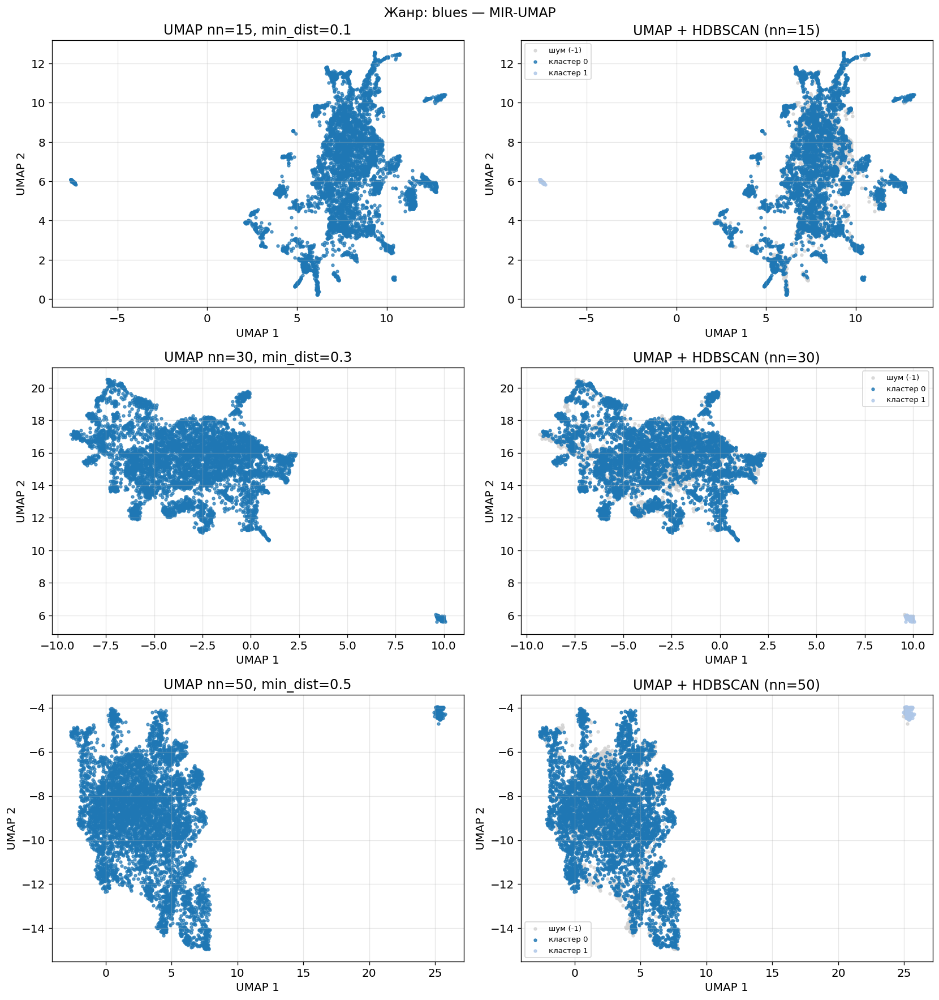

In [5]:
umap_hdbscan_for_genre(GENRE_PATHS["blues"])


### Classical


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_job

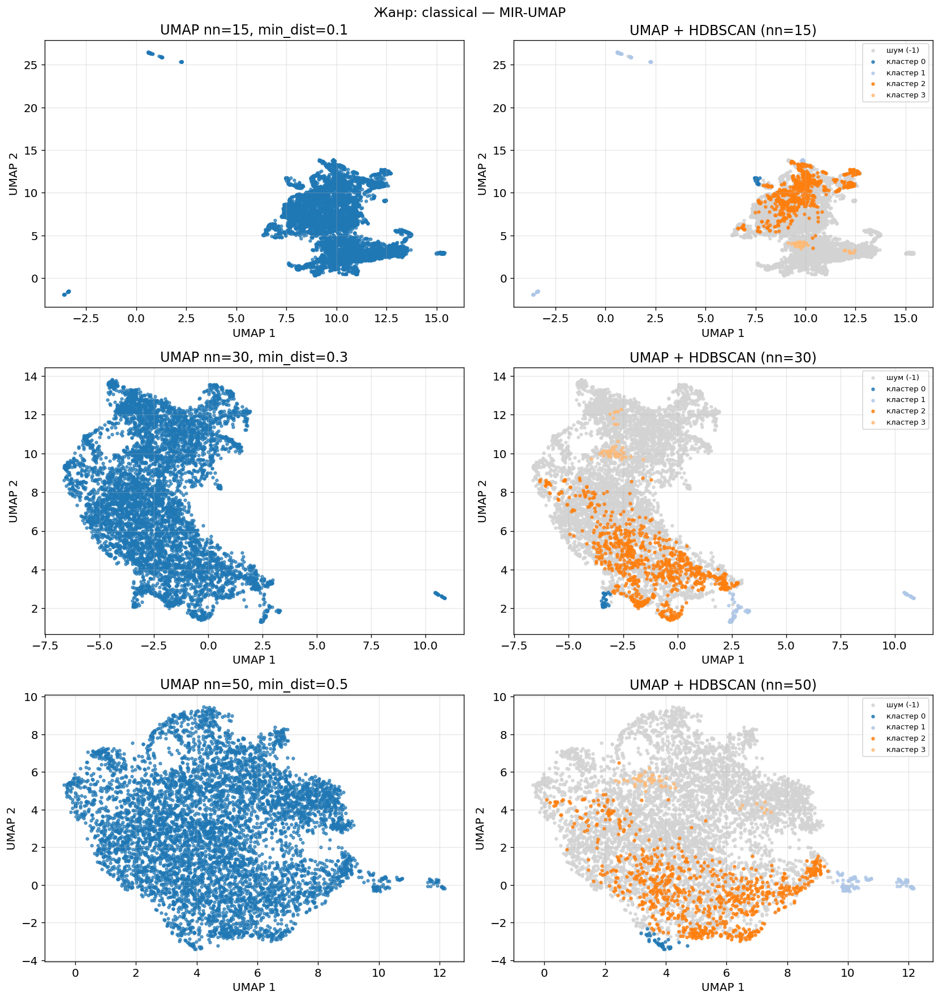

In [6]:
umap_hdbscan_for_genre(GENRE_PATHS["classical"])


### Country


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_job

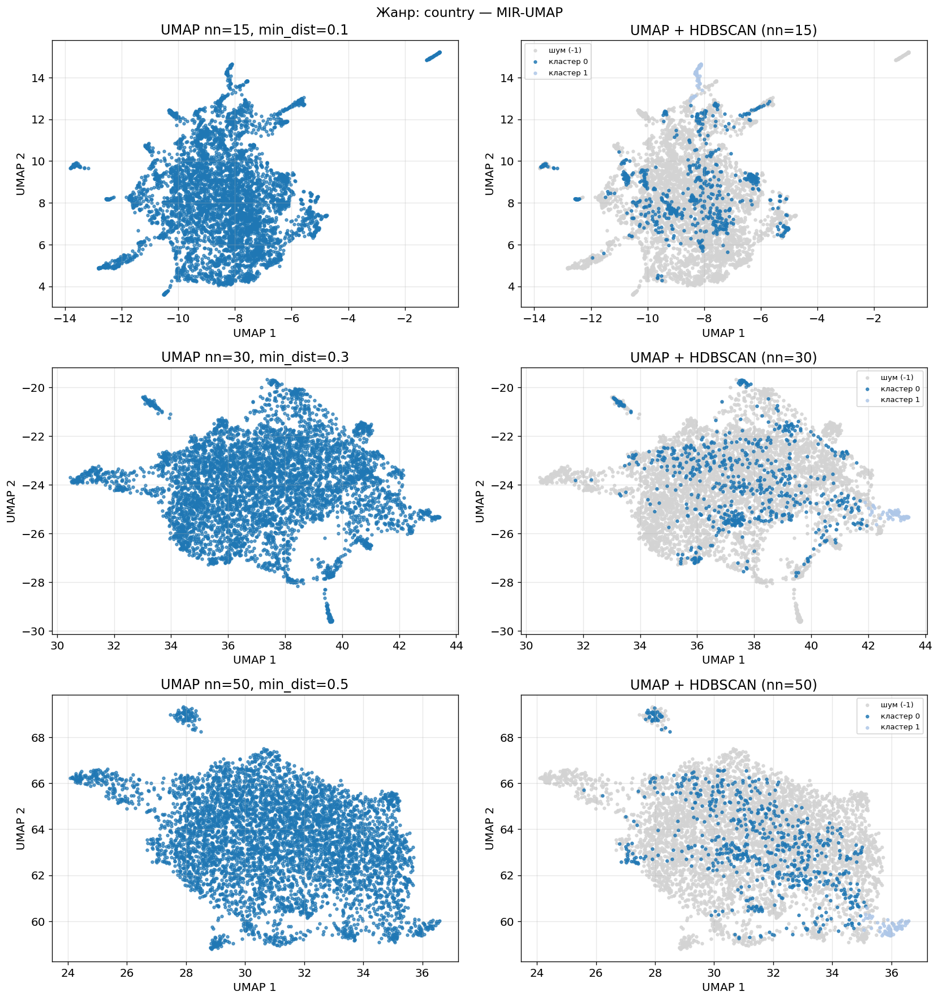

In [7]:
umap_hdbscan_for_genre(GENRE_PATHS["country"])


### Electronic


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_job

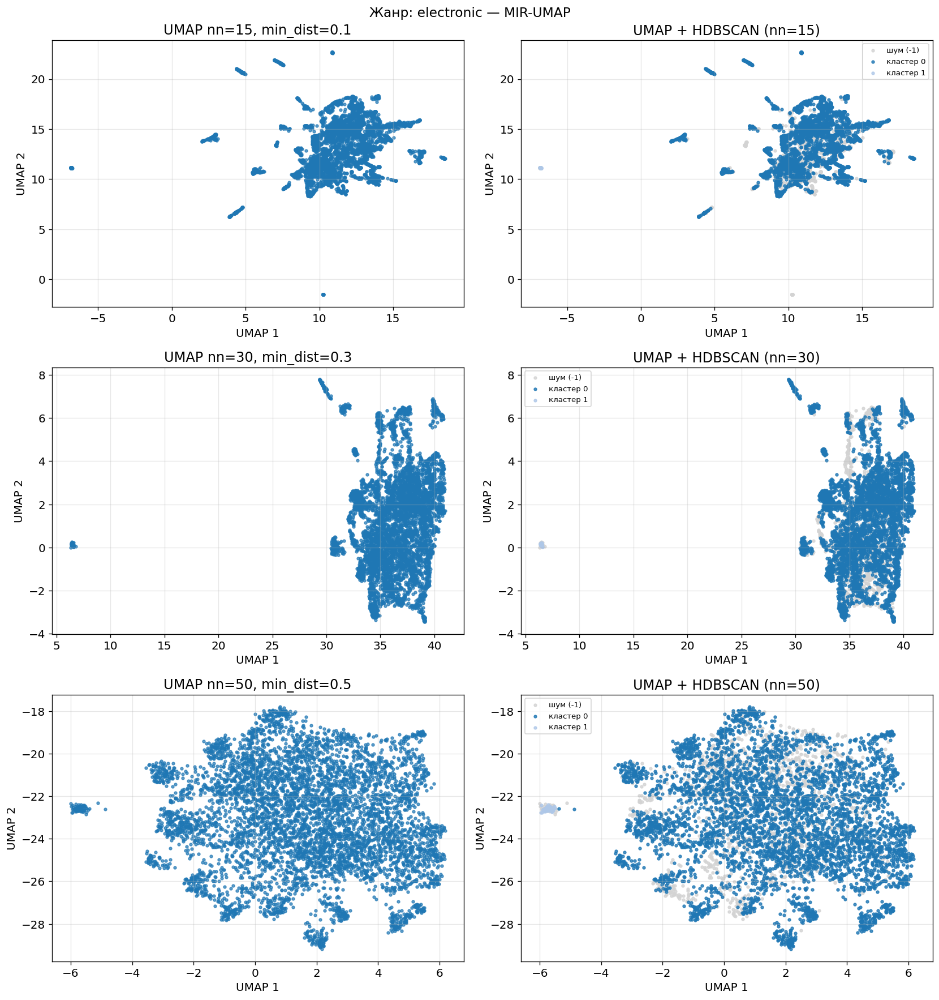

In [8]:
umap_hdbscan_for_genre(GENRE_PATHS["electronic"])


### Hip-hop


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_job

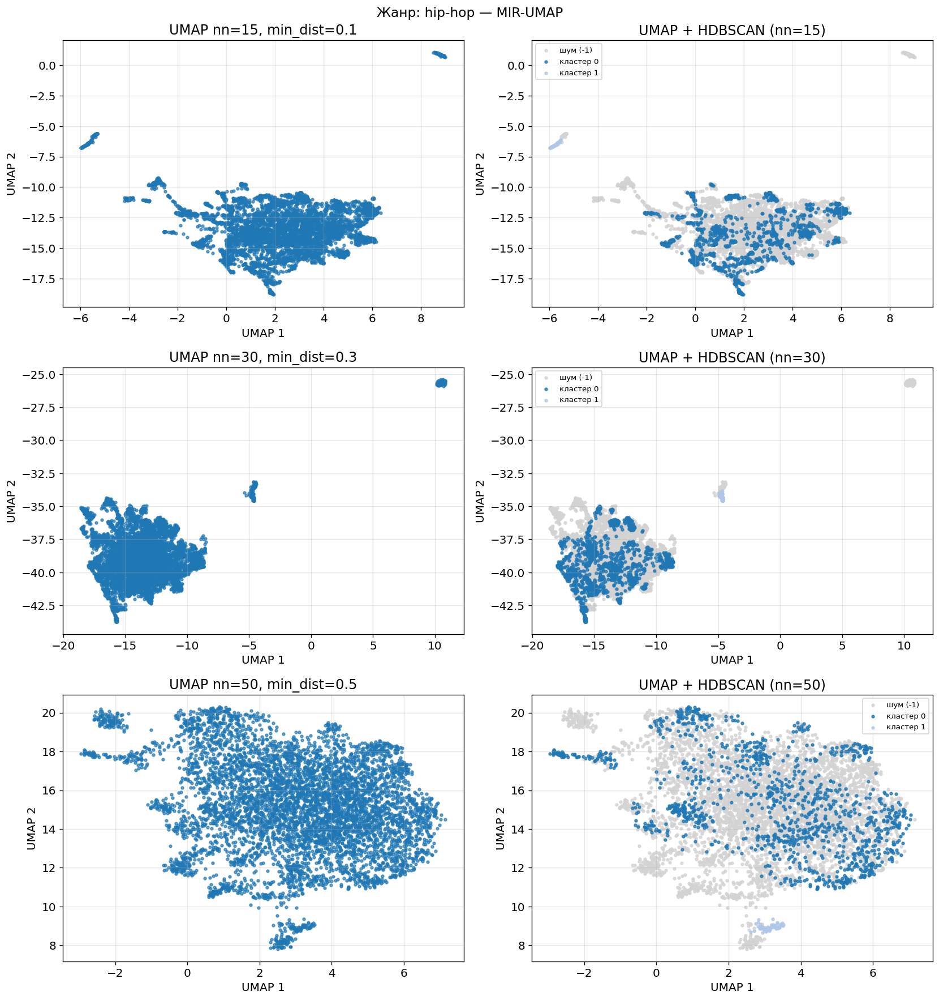

In [9]:
umap_hdbscan_for_genre(GENRE_PATHS["hip-hop"])


### Jazz


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_job

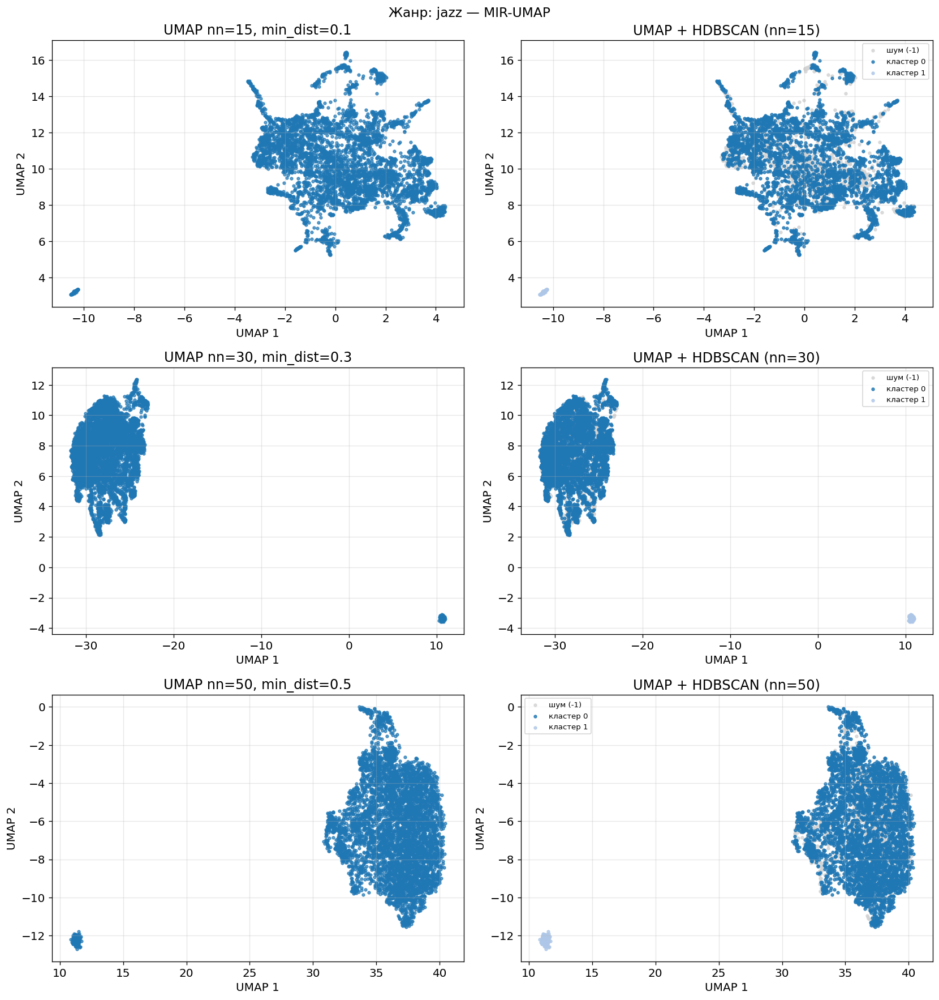

In [10]:
umap_hdbscan_for_genre(GENRE_PATHS["jazz"])


### Metal


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_job

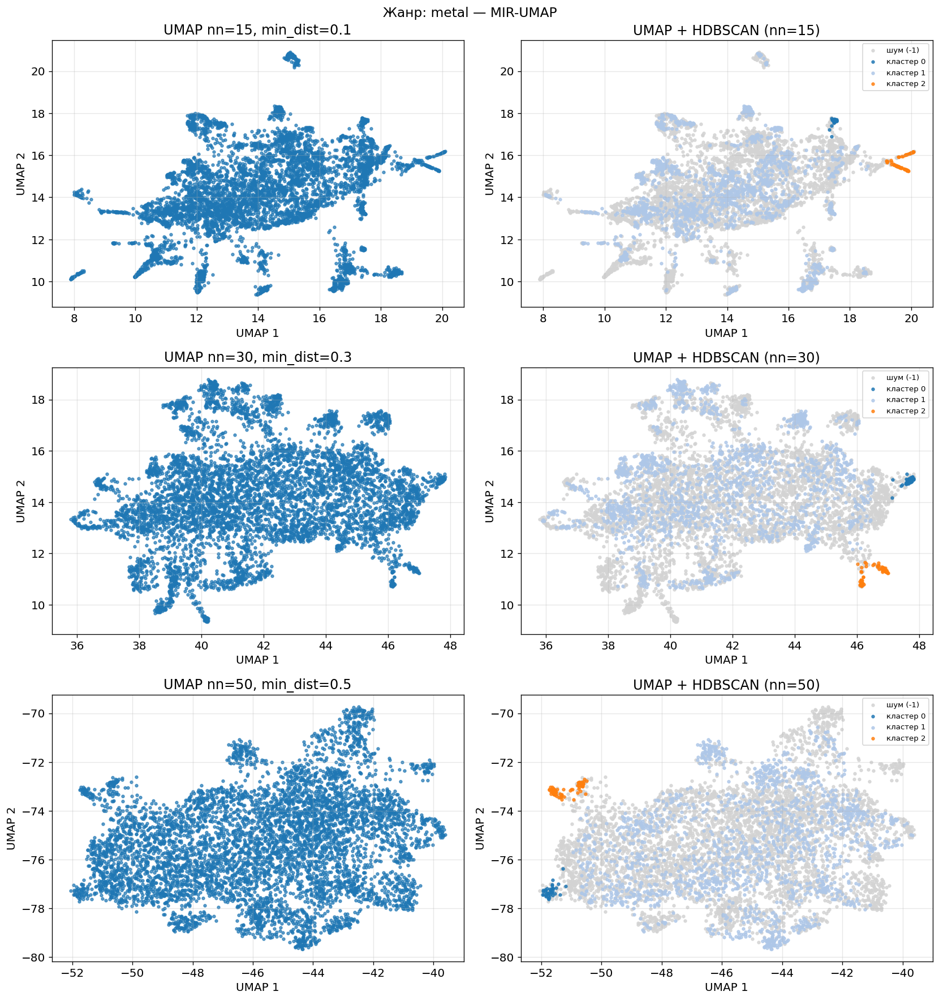

In [11]:
umap_hdbscan_for_genre(GENRE_PATHS["metal"])


### Pop


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_job

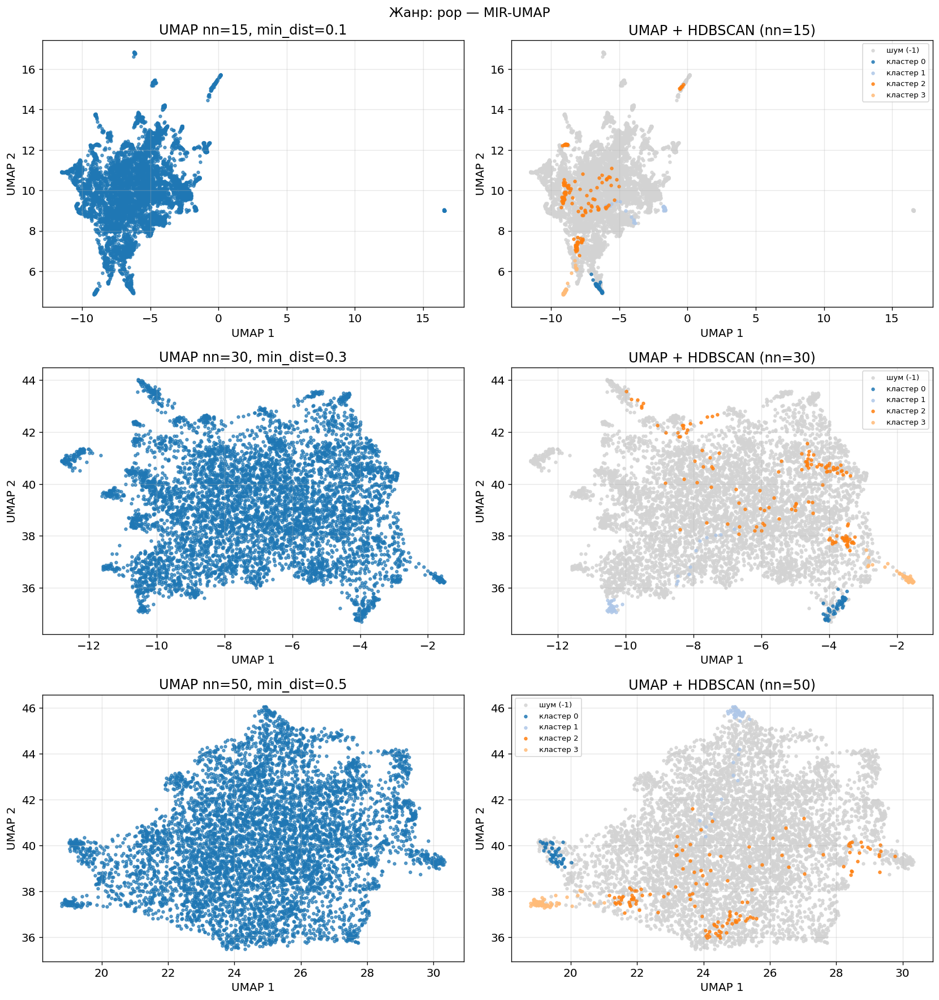

In [12]:
umap_hdbscan_for_genre(GENRE_PATHS["pop"])


### Reggae


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_job

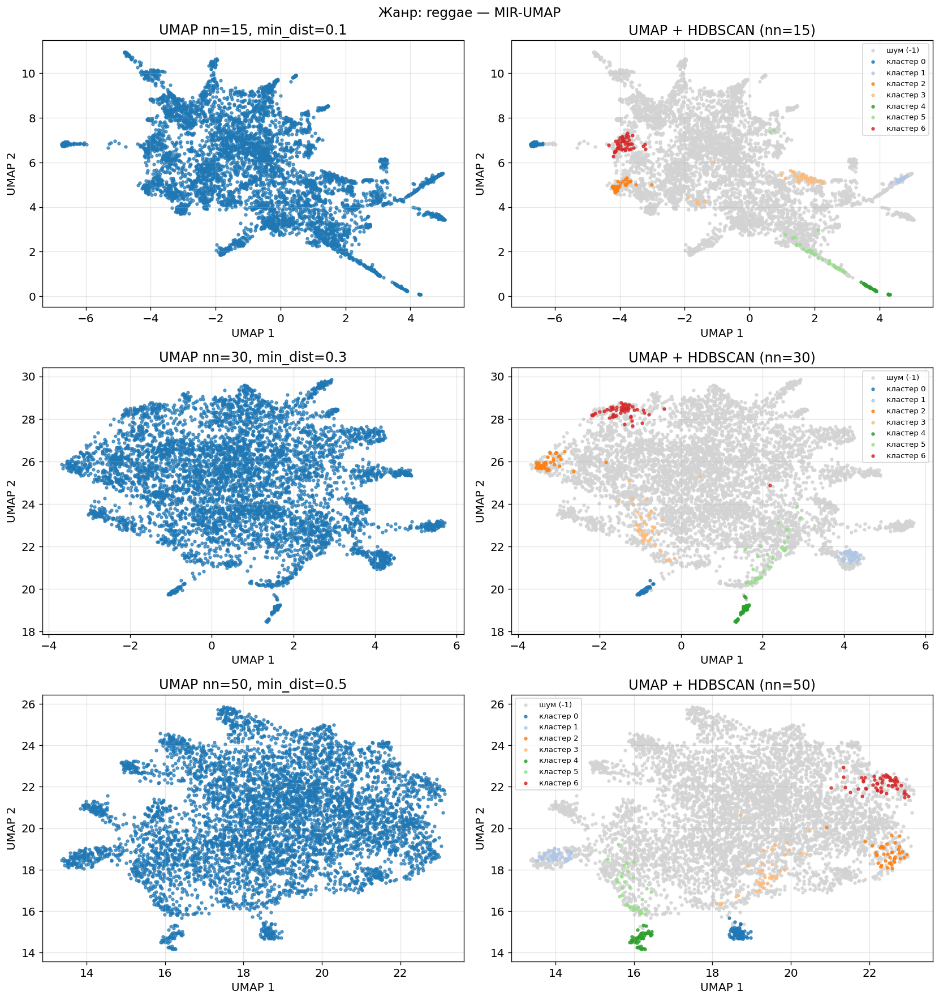

In [13]:
umap_hdbscan_for_genre(GENRE_PATHS["reggae"])


### Rock


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_job

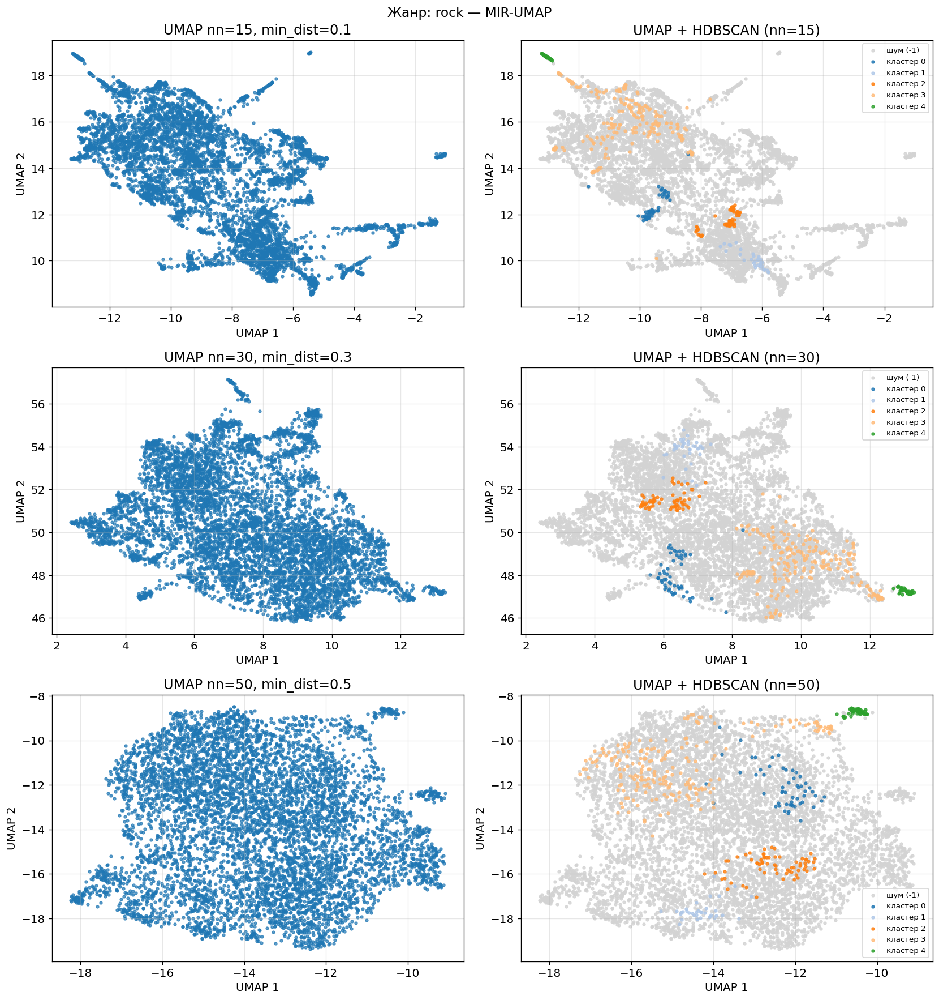

In [14]:
umap_hdbscan_for_genre(GENRE_PATHS["rock"])
